In [1]:
import os
import numpy as np
import soundfile as sf

from matplotlib import pyplot as plt
fig_size = [0,0]
fig_size[0] = 5
fig_size[1] = 4
plt.rcParams["figure.figsize"] = fig_size

from IPython.display import Audio

In [2]:
mix_path = 'SiSEC/DSD100subset/Mixtures/Dev'
truth_path = 'SiSEC/DSD100subset/Sources/Dev'
track_names = os.listdir(mix_path)[1:]

In [3]:
track_name = track_names[0]

(raw_signal,sample_rate) = sf.read(mix_path+'/'+track_name+'/'+'mixture.wav')
(vocal_signal,sample_rate) = sf.read(truth_path+'/'+track_name+'/'+'vocals.wav')

## Functions for manipulating spectrograms

In [4]:
def make_window_function(windowing,window_size):
    if windowing.lower() == 'hann':
        window_function = 1/2*(1-np.cos(2*np.pi*np.linspace(0,window_size,window_size)/(window_size)))
        return window_function
    
    if windowing.lower() == 'triangular':
        window_function = 1-np.abs(2*np.linspace(0,window_size,window_size)/(window_size)-1)
        return window_function
    
    if windowing.lower() == 'rectangular':
        window_function = np.ones(window_size)
        return window_function
    
def create_spectrogram(signal,window_size,overlap,windowing='hann'):
    num_windows = (signal.shape[0]-window_size)//(window_size-overlap)
    spectrogram = np.zeros((num_windows,window_size//2+1))
    phases = np.zeros((num_windows,window_size//2+1))
    
    window_function = make_window_function(windowing,window_size)
    
    loc = 0
    for i in range(num_windows):
        fft = np.fft.rfft(window_function*signal[loc:loc+window_size])
        spectrum = np.abs(fft)
        spectrogram[i] = spectrum
        phases[i] = np.unwrap(np.angle(fft))
        loc += window_size - overlap
    
    return spectrogram,phases

def invert_spectrogram(spectrogram,phases,overlap,windowing='hann'):
    window_size = 2*spectrogram.shape[1] - 2

    reconstructed_signal = np.zeros((window_size-overlap)*(spectrogram.shape[0])+window_size)

    loc = 0
    for i in range(spectrogram.shape[0]):
        fft = spectrogram[i]*np.exp(phases[i]*1.0j)
        chunk = np.fft.irfft(fft)
        reconstructed_signal[loc:loc+window_size] += chunk.real
        loc += window_size - overlap
    return reconstructed_signal

## Create and plot a spectrogram of the mixed signal

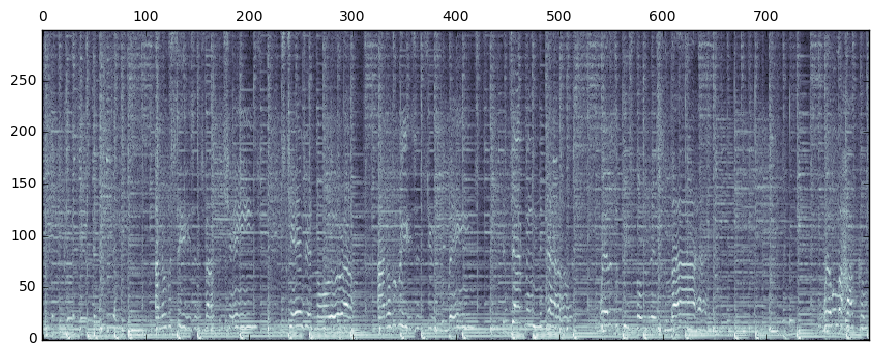

In [5]:
window_size = 1024*2
overlap = window_size//2

squashing = 12

s_m,p_m = create_spectrogram(raw_signal[:,0],window_size,overlap,windowing='hann')

plt.matshow(pow(s_m,1/squashing).T[0:300,0:800],cmap='bone',origin='lower')
plt.show()

## Create and plot a spectrogram of the vocals signal

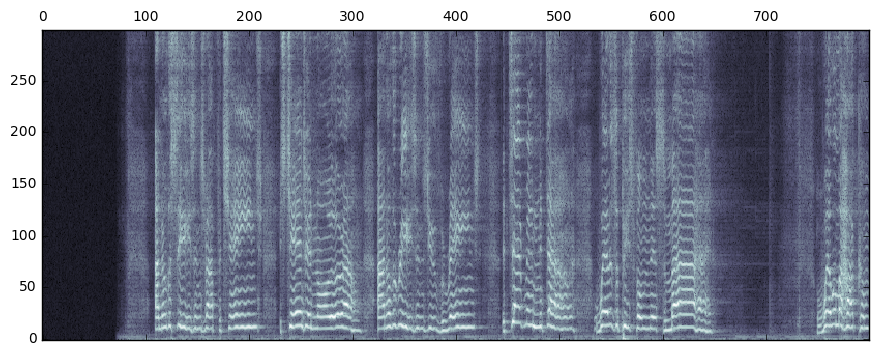

In [6]:
s_v,p_v = create_spectrogram(vocal_signal[:,0],window_size,overlap,windowing='hann')

plt.matshow(pow(s_v,1/squashing).T[0:300,0:800],cmap='bone',origin='lower')
plt.show()

## Check if the original signal can be reconstructed

In [7]:
r_s = invert_spectrogram(s_m,p_m,overlap,windowing='hann')
Audio(r_s, rate=sample_rate)

## Calculate the ideal mask for separating the signal

In [8]:
s_m_n = (s_m-s_m.mean())/s_m.std()
s_v_n = (s_v - s_v.mean())/s_v.mean()

mask = 1/2*(np.sign(s_v_n - s_m_n) +1)

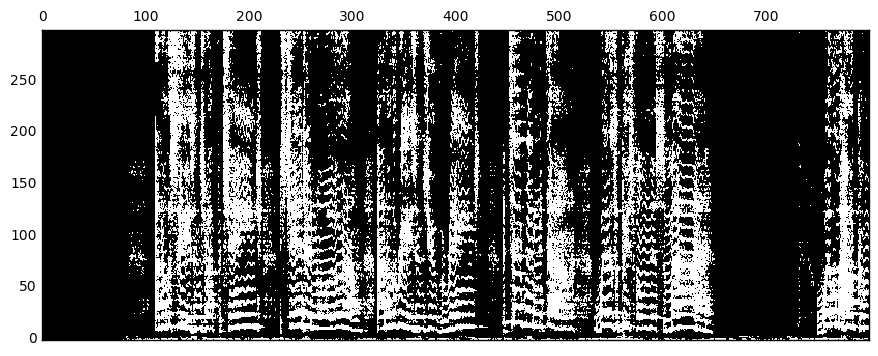

In [9]:
plt.matshow(mask.T[0:300,0:800],cmap='bone',origin='lower')
plt.show()

## Unmix the vocal track and play it

In [10]:
unmixed = (mask)*s_m

In [236]:
r_s = invert_spectrogram(mask,p_m,overlap,windowing='hann')
Audio(r_s, rate=sample_rate)